## Imports

In [1]:
# imports

import numpy as np
import pandas as pd
import keras
import matplotlib.pyplot as plt

from skimage import io, transform
import glob

from keras.models import Sequential
from keras.layers import Input, Dense, Lambda, GlobalAveragePooling2D, MaxPooling2D, Conv2D, Flatten, Dropout, Rescaling
from keras.applications import ResNet50
from keras.applications.resnet50 import preprocess_input
from keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

/Users/sreshtalluri/Documents/CSC/DATA/data403-project3/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


## Data

In [2]:
# get our train data
train_ds = keras.preprocessing.image_dataset_from_directory(
    'data/train',
    subset='training',
    validation_split=0.1,
    seed=42,
    image_size=(256, 256)
)

class_labels = train_ds.class_names

val_ds = keras.preprocessing.image_dataset_from_directory(
    'data/train',
    subset='validation',
    validation_split=0.1,
    seed=42,
    image_size=(256, 256)
)

Found 485 files belonging to 2 classes.
Using 437 files for training.
Found 485 files belonging to 2 classes.
Using 48 files for validation.


images: (32, 256, 256, 3) <dtype: 'float32'> labels: (32,) <dtype: 'int32'>
image data range: 0.0 255.0


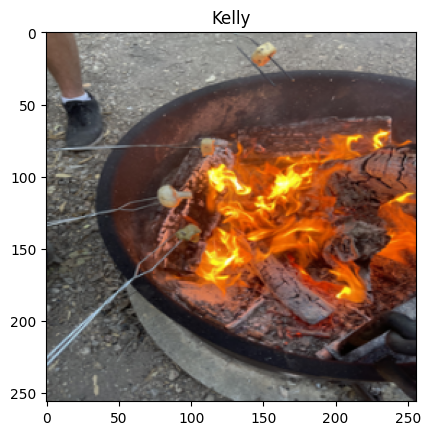

2024-12-05 20:55:11.573445: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [3]:
# checking the data
for images, labels in train_ds.take(1):
  print('images:',images.shape,images.dtype,'labels:',labels.shape,labels.dtype)
  print('image data range:',images[0].numpy().min(),images[0].numpy().max())
  plt.imshow(images[0].numpy().astype('uint8'))
  plt.title(class_labels[labels[0].numpy()])
  plt.show()

In [4]:
# get our test 01 data
test_images1 = []

for filename in glob.glob('data/TestSet01/*.png'):
    img = io.imread(filename)
    # resized data bc all images are different sizes
    img_resize = transform.resize(img, (256,256,3)).astype('float32')
    test_images1.append(img_resize)

test_images1 = np.array(test_images1)
test_images1.shape

(20, 256, 256, 3)

In [5]:
# get our test 02 data
test_images2 = []

for filename in glob.glob('data/TestSet02/*.png'):
    img = io.imread(filename)
    # resized data bc all images are different sizes
    img_resize = transform.resize(img, (256,256,3)).astype('float32')
    test_images2.append(img_resize)

test_images2 = np.array(test_images2)
test_images2.shape

(24, 256, 256, 3)

## Model

In [6]:
model = Sequential([
    Input(shape=(256, 256, 3)),
    Rescaling(1.0/255),
    Lambda(preprocess_input),
    ResNet50(include_top=False, pooling='avg'),
    Dense(2, activation='softmax')
])

model.layers[2].trainable = False

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda (Lambda)                 │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2)              │         4,098 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,591,810 (90.00 MB)

 Trainable params: 4,098 (16.01 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [7]:
model.compile(
    optimizer=Adam(learning_rate=3e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [8]:
# Define callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
lr_reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)
checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    callbacks=[early_stop, lr_reduce, checkpoint]
)

Epoch 1/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 69s 5s/step - accuracy: 0.5307 - loss: 0.6954 - val_accuracy: 0.5417 - val_loss: 0.6841 - learning_rate: 3.0000e-04
Epoch 2/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 65s 5s/step - accuracy: 0.5561 - loss: 0.6844 - val_accuracy: 0.5208 - val_loss: 0.6827 - learning_rate: 3.0000e-04
Epoch 3/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 65s 5s/step - accuracy: 0.6358 - loss: 0.6810 - val_accuracy: 0.6042 - val_loss: 0.6810 - learning_rate: 3.0000e-04
Epoch 4/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 60s 4s/step - accuracy: 0.6124 - loss: 0.6833 - val_accuracy: 0.5000 - val_loss: 0.6767 - learning_rate: 3.0000e-04
Epoch 5/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 68s 5s/step - accuracy: 0.5422 - loss: 0.6837 - val_accuracy: 0.5000 - val_loss: 0.6738 - learning_rate: 3.0000e-04
Epoch 6/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 67s 5s/step - accuracy: 0.5557 - loss: 0.6830 - val_accuracy: 0.6458 - val_loss: 0.6724 - learning_rate: 3.0000e-04
Epoch 7/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 63s 5s/step - accuracy: 0.5915 - loss:

In [9]:
# Unfreeze top N layers of ResNet50 for fine-tuning
N = 10  # Number of layers to unfreeze
resnet_base = model.layers[2]

for layer in resnet_base.layers[-N:]:
    layer.trainable = True

# Recompile the model with a lower learning rate
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [10]:
# Continue training with fine-tuning
history_fine = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    callbacks=[early_stop, lr_reduce, checkpoint]
)

Epoch 1/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 80s 5s/step - accuracy: 0.6004 - loss: 0.6601 - val_accuracy: 0.6458 - val_loss: 0.6590 - learning_rate: 1.0000e-05
Epoch 2/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 68s 5s/step - accuracy: 0.7260 - loss: 0.6102 - val_accuracy: 0.7917 - val_loss: 0.6600 - learning_rate: 1.0000e-05
Epoch 3/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 67s 5s/step - accuracy: 0.7459 - loss: 0.5773 - val_accuracy: 0.6458 - val_loss: 0.6668 - learning_rate: 1.0000e-05
Epoch 4/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 70s 5s/step - accuracy: 0.7204 - loss: 0.5669 - val_accuracy: 0.4792 - val_loss: 0.6785 - learning_rate: 1.0000e-05
Epoch 5/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 86s 6s/step - accuracy: 0.7385 - loss: 0.5514 - val_accuracy: 0.4583 - val_loss: 0.6901 - learning_rate: 2.0000e-06
Epoch 6/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 81s 6s/step - accuracy: 0.7460 - loss: 0.5517 - val_accuracy: 0.4583 - val_loss: 0.7042 - learning_rate: 2.0000e-06


In [11]:
# Load the best fine-tuned model
model.load_weights('best_model.keras')

# Evaluate the model
val_loss, val_accuracy = model.evaluate(val_ds)
print(f'Validation Loss: {val_loss}')
print(f'Validation Accuracy: {val_accuracy}')

2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.6389 - loss: 0.6610
Validation Loss: 0.6590243577957153
Validation Accuracy: 0.6458333134651184


## Predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


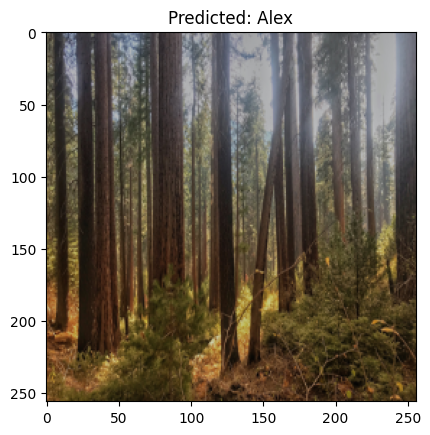

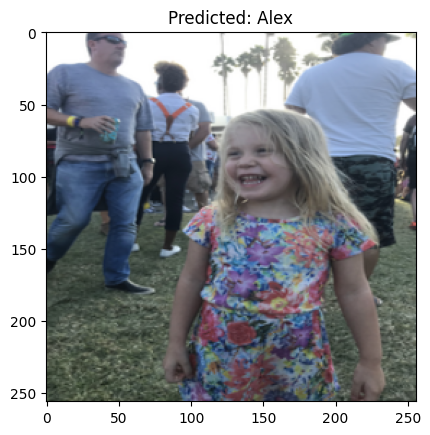

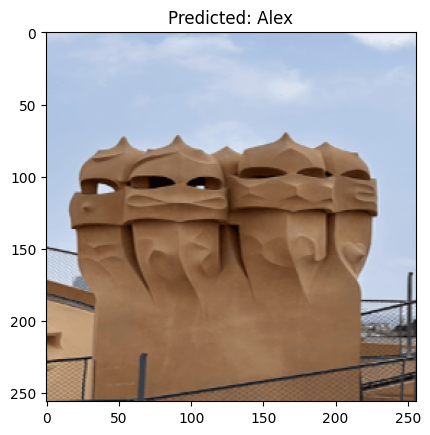

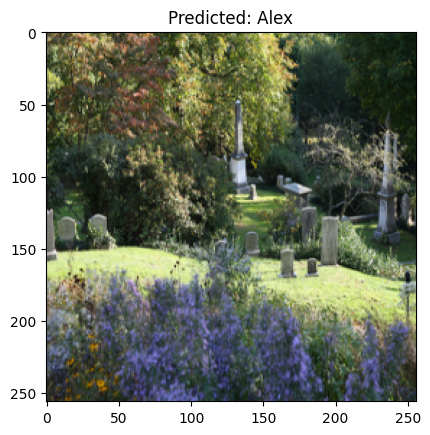

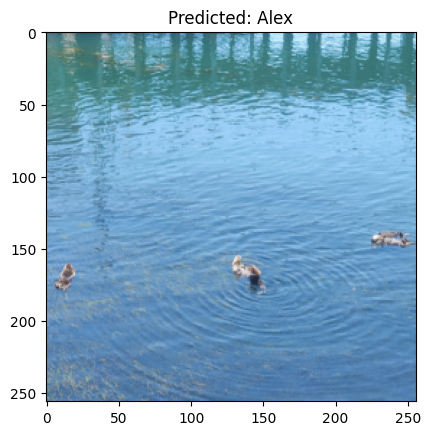

...

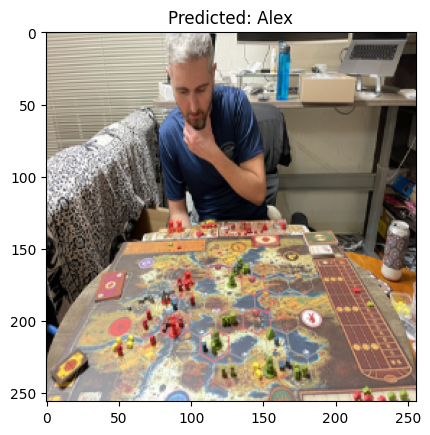

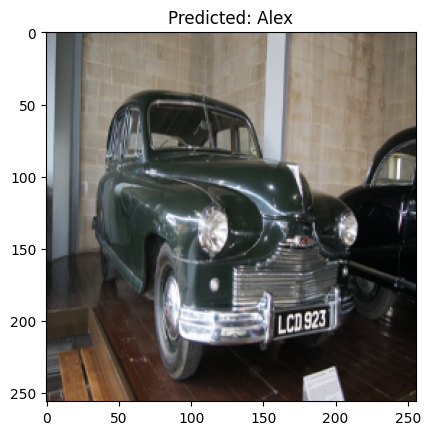

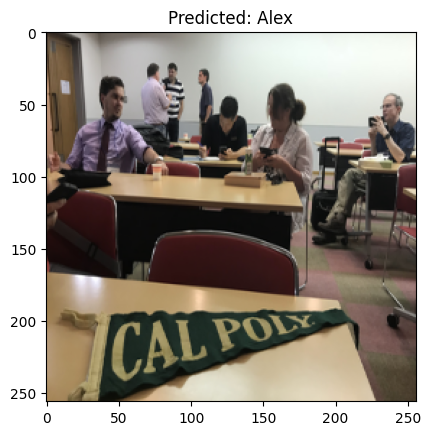

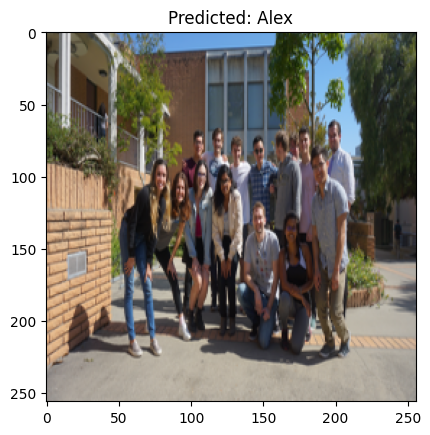

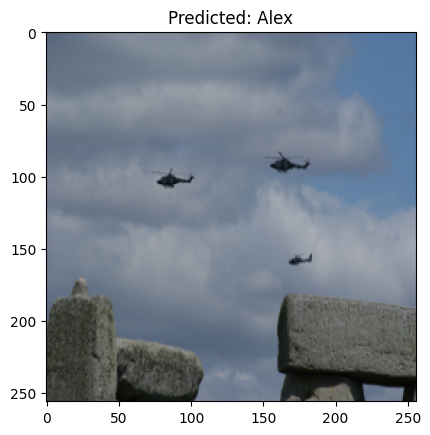

In [12]:
# predictions for test set 01
preds1 = model.predict(test_images1)

for img, pred in zip(test_images1, preds1):
    plt.imshow(img)
    plt.title(f"Predicted: {class_labels[np.argmax(pred)]}")
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


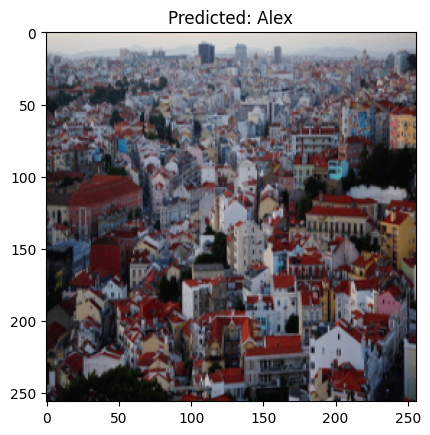

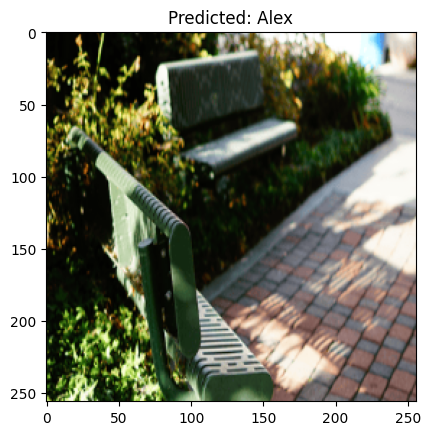

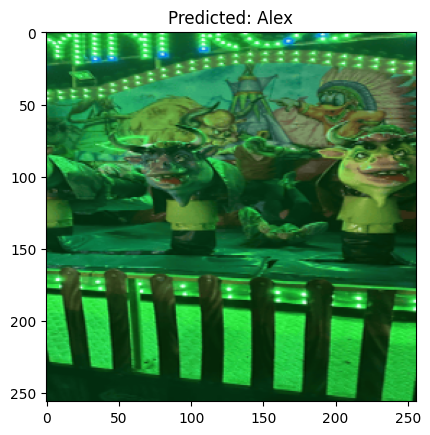

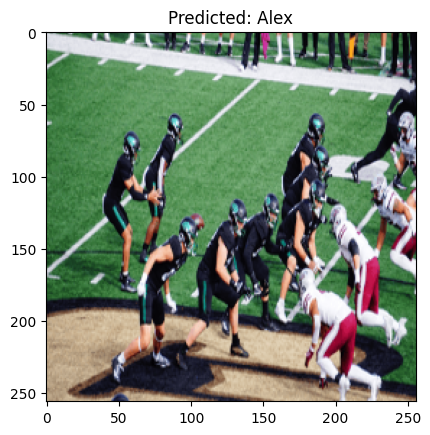

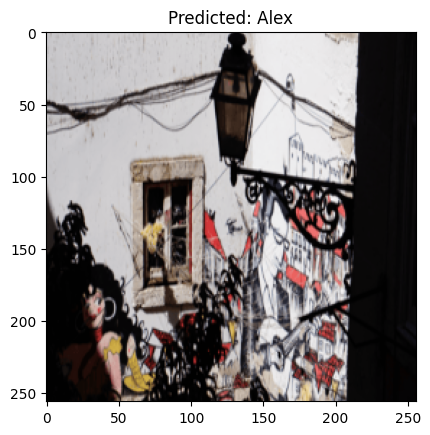

...

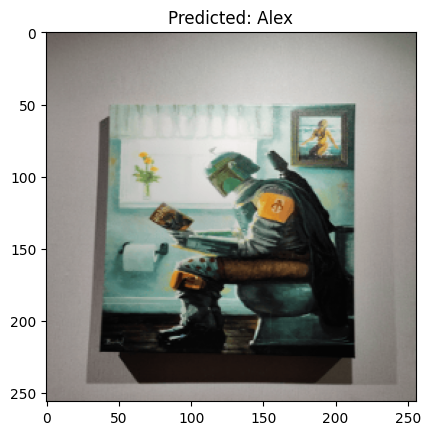

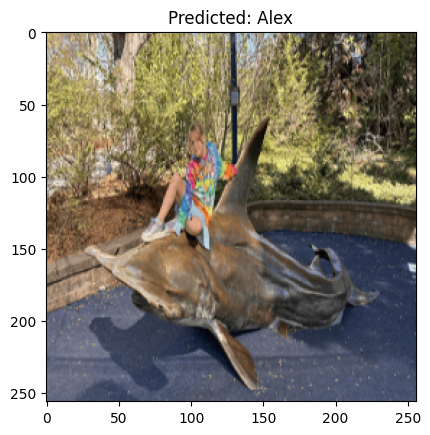

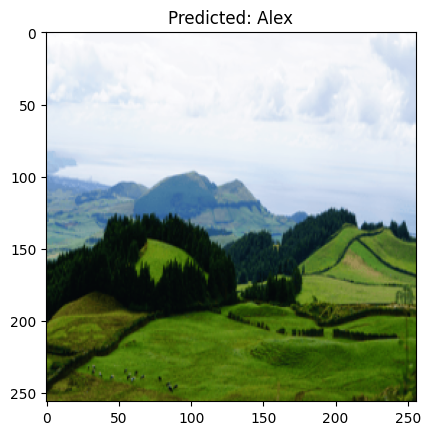

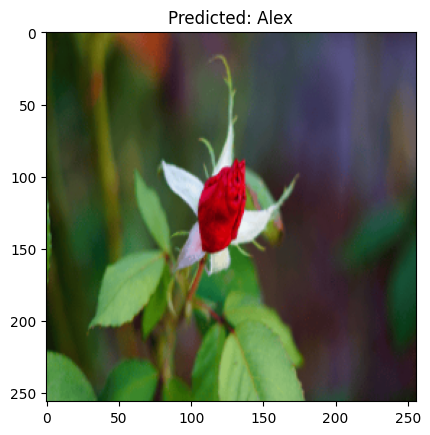

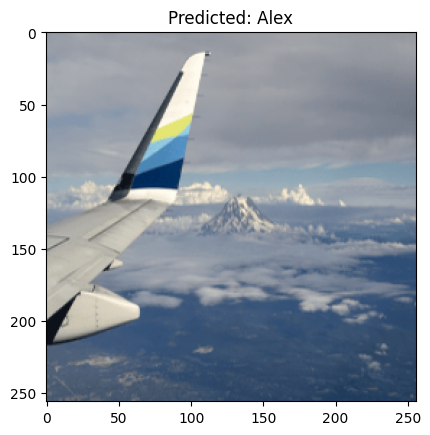

In [13]:
# predictions for test set 02
preds2 = model.predict(test_images2)

for img, pred in zip(test_images2, preds2):
    plt.imshow(img)
    plt.title(f"Predicted: {class_labels[np.argmax(pred)]}")
    plt.show()